Split data into train and test folders

In [64]:
import os
import shutil
import random
import numpy as np

curr_dir = os.getcwd()

data_folder = os.path.join(curr_dir, "data")
train_folder = os.path.join(curr_dir, "train")
test_folder = os.path.join(curr_dir, "test")

# List all folders in the data directory
folders = os.listdir(data_folder)

# Shuffle the folders
random.shuffle(folders)

# Calculate the split index
split_index = int(0.6 * len(folders))

# Split folders into train and test sets
train_folders = folders[:split_index]
test_folders = folders[split_index:]

# Function to move data into train or test directory
def move_data(source_folder, dest_folder, folders):
    for folder in folders:
        source_path = os.path.join(source_folder, folder)
        dest_path = os.path.join(dest_folder, folder)
        shutil.move(source_path, dest_path)

# Move train data
move_data(data_folder, train_folder, train_folders)

# Move test data
move_data(data_folder, test_folder, test_folders)


Set up train and test data loaders

In [65]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import pandas as pd

batch_size = 32

img_height = 369
img_width = 496

# Create ImageDataGenerator for training data
train_datagen = ImageDataGenerator(rescale=1./255)  # TODO watch out for normalization / resizing issues

# Create ImageDataGenerator for testing data (optional)
test_datagen = ImageDataGenerator()     # keep the rescale here? idk

# Function to load data into memory
def load_data(directory):
    data = []  # List to store tuples of (mix_path, [music_path, sp0_path, sp1_path])
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith('.png') and 'mix' in file:
                mix_path = os.path.join(root, file)
                id = "id_" + file.split('_')[1]  # Extract the id
                music_path = os.path.join(root, id + '_music.png')
                sp0_path = os.path.join(root, id + '_sp0.png')
                sp1_path = os.path.join(root, id + '_sp1.png')

                music_img = np.array(Image.open(music_path), dtype=np.float32) / 255.0
                sp0_img = np.array(Image.open(sp0_path), dtype=np.float32) / 255.0
                sp1_img = np.array(Image.open(sp1_path), dtype=np.float32) / 255.0

                # Ensure target images have only 3 channels
                music_img = music_img[:, :, :3]  # Select first three channels
                sp0_img = sp0_img[:, :, :3]  # Select first three channels
                sp1_img = sp1_img[:, :, :3]  # Select first three channels

                print(music_img.shape, sp0_img.shape, sp1_img.shape)
                print(music_img.dtype, sp0_img.dtype, sp1_img.dtype)
 
                data.append((mix_path, music_img, sp0_img, sp1_img))
    return data

# Load training data into memory
train_data = load_data(train_folder)

# Load testing data into memory (optional)
test_data = load_data(test_folder)

# Convert data into DataFrame
train_df = pd.DataFrame(train_data, columns=['mix', 'music', 'sp0', 'sp1'])
test_df = pd.DataFrame(test_data, columns=['mix', 'music', 'sp0', 'sp1'])

y_cols = ['music', 'sp0', 'sp1']    # multiple "targets" - each source

# Create generators
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='mix',
    y_col=y_cols,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='raw',  # This mode is used for regression tasks
    shuffle=False,
    seed=42
)

# Optionally create a test generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='mix',
    y_col=y_cols,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='raw',
    shuffle=False,
    seed=42
)


(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496, 3) (369, 496, 3) (369, 496, 3)
float32 float32 float32
(369, 496,

check generators load data properly \
target 1 is music, 2 sp0, 3 sp1

[[[0.02745098 0.02352941 0.10980392]
  [0.02745098 0.02352941 0.10980392]
  [0.02745098 0.02352941 0.10980392]
  ...
  [0.4509804  0.1254902  0.5058824 ]
  [0.4509804  0.1254902  0.5058824 ]
  [0.4509804  0.1254902  0.5058824 ]]

 [[0.02745098 0.02352941 0.10980392]
  [0.02745098 0.02352941 0.10980392]
  [0.02745098 0.02352941 0.10980392]
  ...
  [0.4509804  0.1254902  0.5058824 ]
  [0.4509804  0.1254902  0.5058824 ]
  [0.4509804  0.1254902  0.5058824 ]]

 [[0.01176471 0.01176471 0.05882353]
  [0.01176471 0.01176471 0.05882353]
  [0.01176471 0.01176471 0.05882353]
  ...
  [0.48235294 0.13725491 0.50980395]
  [0.48235294 0.13725491 0.50980395]
  [0.48235294 0.13725491 0.50980395]]

 ...

 [[0.67058825 0.2        0.4862745 ]
  [0.67058825 0.2        0.4862745 ]
  [0.67058825 0.2        0.4862745 ]
  ...
  [0.827451   0.2627451  0.43137255]
  [0.827451   0.2627451  0.43137255]
  [0.827451   0.2627451  0.43137255]]

 [[0.67058825 0.2        0.4862745 ]
  [0.67058825 0.2        0.4862745 ]


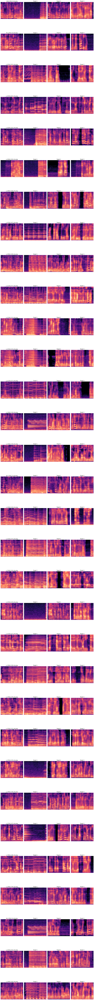

In [66]:
import matplotlib.pyplot as plt

def visualize_batch(generator):
    # Generate a batch of data
    x_batch, y_batch = next(generator)

    num_samples = len(x_batch)
    num_targets = len(y_batch[0])  # Assuming all samples have the same number of targets

    fig, axes = plt.subplots(num_samples, num_targets + 1, figsize=(15, 5*num_samples))
    
    for i, (mix_img, targets) in enumerate(zip(x_batch, y_batch)):
        # Plot mix image
        mix_filename = generator.filenames[i]
        #print(type(mix_img[0][0][0]))
        axes[i, 0].imshow(mix_img)
        axes[i, 0].set_title(mix_filename[-20:])
        axes[i, 0].axis('off')

        # Plot target images
        for j, target_img in enumerate(targets):
            print(target_img)
            axes[i, j+1].imshow(target_img)
            axes[i, j+1].set_title(f'Target {j+1}')
            axes[i, j+1].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize a batch of training data
visualize_batch(train_generator)


build the model

In [67]:
import tensorflow as tf
from tensorflow.keras.models import Model

def transformer_layer(units, heads, dff, rate=0.1):
    inputs = tf.keras.Input(shape=(24, 31, 512))

    # Reshape input for MultiHeadAttention
    reshaped_inputs = tf.keras.layers.Reshape((-1, units))(inputs)

    # Multi-head self-attention mechanism
    attention = tf.keras.layers.MultiHeadAttention(num_heads=heads, key_dim=units)(reshaped_inputs, reshaped_inputs)
    attention = tf.keras.layers.Dropout(rate)(attention)
    attention = tf.keras.layers.LayerNormalization(epsilon=1e-6)(attention + reshaped_inputs)

    # Reshape back to original shape
    attention = tf.keras.layers.Reshape((-1, 1, units))(attention)

    # Feed-forward network
    outputs = tf.keras.layers.Dense(dff, activation='relu')(attention)
    outputs = tf.keras.layers.Dense(units)(outputs)
    outputs = tf.keras.layers.Dropout(rate)(outputs)
    outputs = tf.keras.layers.LayerNormalization(epsilon=1e-6)(outputs + attention)

    return tf.keras.Model(inputs=inputs, outputs=outputs)

def build_demucs(input_shape):
    # Encoder
    inputs = tf.keras.layers.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(64, kernel_size=3, strides=2, padding='same', activation='relu')(inputs)
    x = tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding='same', activation='relu')(x)
    x = tf.keras.layers.Conv2D(256, kernel_size=3, strides=2, padding='same', activation='relu')(x)
    encoder_output = tf.keras.layers.Conv2D(512, kernel_size=3, strides=2, padding='same', activation='relu')(x)

    # Transformer
    transformer_output = transformer_layer(units=512, heads=8, dff=2048)(encoder_output)

    # Decoder
    x = tf.keras.layers.Conv2DTranspose(256, kernel_size=3, strides=2, padding='same', activation='relu')(transformer_output)
    x = tf.keras.layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding='same', activation='relu')(x)
    x = tf.keras.layers.Conv2DTranspose(64, kernel_size=3, strides=2, padding='same', activation='relu')(x)
    decoder_output = tf.keras.layers.Conv2DTranspose(3, kernel_size=3, strides=2, padding='same', activation='sigmoid')(x)

    # Create model
    model = Model(inputs=inputs, outputs=decoder_output)
    return model

# Example usage
input_shape = (img_height, img_width, 3)  # we actually have 4 channels after chekcing the shape TODO we did something to the transformer part to accomodate that thinking it was 3 <-- fix?
model = build_demucs(input_shape)
model.summary()

input_layer = model.layers[0]  # Assuming the input layer is the first layer
print("Input shape:", input_layer.input_shape)
print("Input data type:", input_layer.dtype)
output_layer = model.layers[-1]
output_shape = model.layers[-1].output_shape
print("Output shape:", output_shape)
print("Output data type:", output_layer.dtype)

Model: "model_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_39 (InputLayer)       [(None, 369, 496, 3)]     0         
                                                                 
 conv2d_77 (Conv2D)          (None, 185, 248, 64)      1792      
                                                                 
 conv2d_78 (Conv2D)          (None, 93, 124, 128)      73856     
                                                                 
 conv2d_79 (Conv2D)          (None, 47, 62, 256)       295168    
                                                                 
 conv2d_80 (Conv2D)          (None, 24, 31, 512)       1180160   
                                                                 
 model_34 (Functional)       (None, 744, 1, 512)       10503168  
                                                                 
 conv2d_transpose_63 (Conv2D  (None, 1488, 2, 256)     117

In [68]:
# Get a batch of data from the generator
batch_data = next(train_generator)

# Extract input and target data from the batch
input_data, target_data = batch_data

# Inspect the shape and data type of the input and target data
print("Input data shape:", input_data.shape)
print("Input data type:", input_data.dtype)

print("Target data shape:", target_data.shape)
print("Target data type:", target_data.dtype)

Input data shape: (32, 369, 496, 3)
Input data type: float32
Target data shape: (32, 3)
Target data type: object


train the model

In [69]:
from keras.callbacks import LearningRateScheduler   # TODO make the squiggles go away? at least make them consistent
import math

train_samples = 480 # 480 folders in train dir
test_samples = 320  # 320 folders in test dir

# SDR loss func
def sdr(y_true, y_pred):
    # Calculate SDR (source-to-distortion ratio)
    numerator = tf.reduce_sum(tf.square(y_true), axis=-1)
    denominator = tf.reduce_sum(tf.square(y_true - y_pred), axis=-1)
    sdr = 10 * tf.math.log(numerator / denominator + 1e-10) / tf.math.log(10.0)
    # Return negative SDR as loss (minimize negative SDR)
    return -tf.reduce_mean(sdr)

model.compile(loss=sdr,
              optimizer = tf.keras.optimizers.Adam())

## callbacks
# model checkpoint
save_model_path = '/tmp/ml_weights.hdf5'
cp = tf.keras.callbacks.ModelCheckpoint(filepath=save_model_path, monitor='val_loss', mode='max', save_best_only=True)  # max because higher sdr is better

# early stopping
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss',  # Monitor the validation loss
                                        patience=12,          # Number of epochs with no improvement after which training will be stopped
				        restore_best_weights=True)      # Restore best weights from that period

# learning rate scheduler
def scheduler(epoch, lr):
	initial_lrate = 0.001
	drop = 0.1
	epochs_drop = 10
	lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
	return lrate

lr_schedule = LearningRateScheduler(scheduler)

history = model.fit(
      train_generator,
      steps_per_epoch=int(np.ceil(train_samples / float(batch_size))),
      epochs=50,
      validation_data=test_generator,
      validation_steps=int(np.ceil(test_samples / float(batch_size))),
      callbacks = [cp, es, lr_schedule],
      verbose=1
)



ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type numpy.ndarray).